In [9]:
%load_ext autoreload
%autoreload 2

The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload


In [10]:
import time
import numpy as np
import matplotlib.pyplot as matplt

from rmtpy.ensemble import GOE

In [13]:
def _build_m_labels(M):
    labels = []
    for m in M:
        labels.append("m = "+str(m))
    return labels

In [18]:
def print_variations(times_naive, times_tridiag):
    print("\t Naive computation:")
    for i in range(1, len(times_naive)):
        print(times_naive[i-1], '->', times_naive[i], ':', times_naive[i]-times_naive[i-1])
    
    print("\t Tridiagonal computation:")
    for i in range(1, len(times_tridiag)):
        print(times_tridiag[i-1], '->', times_tridiag[i], ':', times_tridiag[i]-times_tridiag[i-1])

In [14]:
# 1 bin simulation

	 Naive computation:
[3.12722921] -> [18.3635354] : [15.23630619]
[18.3635354] -> [86.18551493] : [67.82197952]
[86.18551493] -> [240.31840563] : [154.1328907]
[240.31840563] -> [431.04300499] : [190.72459936]
[431.04300499] -> [745.84649801] : [314.80349302]
[745.84649801] -> [1124.74281788] : [378.89631987]
[1124.74281788] -> [1961.40867472] : [836.66585684]
[1961.40867472] -> [2833.88825655] : [872.47958183]
	 Tridiagonal computation:
[0.50475597] -> [0.9750843] : [0.47032833]
[0.9750843] -> [1.85420513] : [0.87912083]
[1.85420513] -> [3.62181664] : [1.7676115]
[3.62181664] -> [5.12138605] : [1.49956942]
[5.12138605] -> [7.30251074] : [2.18112469]
[7.30251074] -> [8.89737606] : [1.59486532]
[8.89737606] -> [13.46604824] : [4.56867218]
[13.46604824] -> [16.16860628] : [2.70255804]


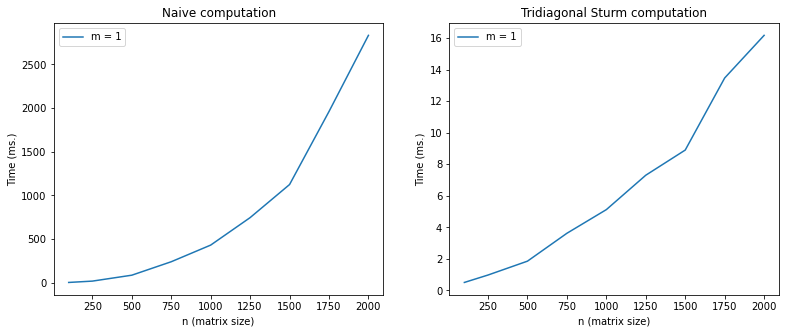

In [20]:
interval = (-2,2)
to_norm = False

N = [100, 250, 500, 750, 1000, 1250, 1500, 1750, 2000]
M = [1]

times_naive = np.zeros((len(N), len(M)))
times_tridiag = np.zeros((len(N), len(M)))

nreps = 20

for (i, n) in enumerate(N):
    for (j, m) in enumerate(M):
        for k in range(nreps):
            goe1 = GOE(n=n, use_tridiagonal=False)
            t1 = time.time()
            eig_hist_nt, bins_nt = goe1.eigval_hist(bins=m, interval=interval, normed_hist=to_norm)
            t2 = time.time()
            times_naive[i][j] += (t2 - t1)*1000 # ms

            goe2 = GOE(n=n, use_tridiagonal=True)
            t1 = time.time()
            eig_hist_nt, bins_nt = goe2.eigval_hist(bins=m, interval=interval, normed_hist=to_norm)
            t2 = time.time()
            times_tridiag[i][j] += (t2 - t1)*1000 # ms
    
        times_naive[i][j] /= nreps
        times_tridiag[i][j] /= nreps

fig, axes = matplt.subplots(nrows=1, ncols=2)
fig.set_figheight(5)
fig.set_figwidth(13)
fig.subplots_adjust(hspace=.5)

labels = _build_m_labels(M)

lines = axes[0].plot(N, times_naive)
axes[0].legend(lines, labels)
axes[0].set_title('Naive computation')
axes[0].set_xlabel('n (matrix size)')
axes[0].set_ylabel('Time (ms.)')

lines = axes[1].plot(N, times_tridiag)
axes[1].legend(lines, labels)
axes[1].set_title('Tridiagonal Sturm computation')
axes[1].set_xlabel('n (matrix size)')
_ = axes[1].set_ylabel('Time (ms.)')

print_variations(times_naive, times_tridiag)


# Tridiag hist vs Standard hist

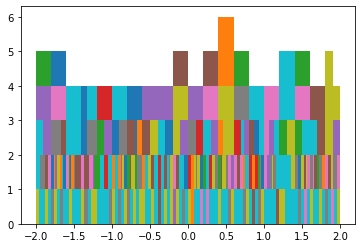

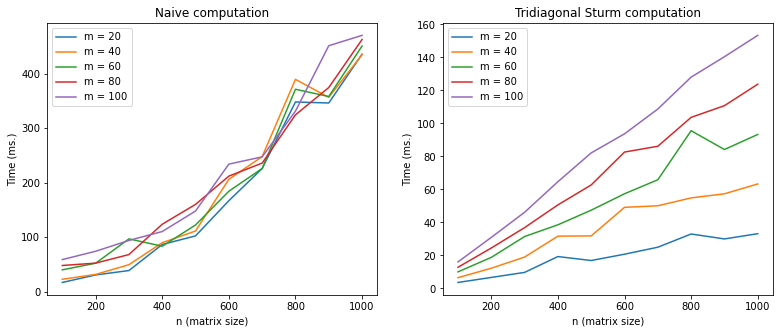

In [6]:
interval = (-2,2)
to_norm = False

N = [200, 400, 600, 800, 1000, 1200, 1400, 1600]
M = [20, 40, 60, 80, 100, 120]

times_naive = np.zeros((len(N), len(M)))
times_tridiag = np.zeros((len(N), len(M)))

interval = (-2, 2)

nreps = 20

for (i, n) in enumerate(N):
    for (j, m) in enumerate(M):
        for k in range(nreps):
            goe1 = GOE(n=n, use_tridiagonal=False)
            t1 = time.time()
            eig_hist_nt, bins_nt = goe1.eigval_hist(bins=m, interval=interval, normed_hist=to_norm)
            t2 = time.time()
            times_naive[i][j] += (t2 - t1)*1000 # ms

            goe2 = GOE(n=n, use_tridiagonal=True)
            t1 = time.time()
            eig_hist_nt, bins_nt = goe2.eigval_hist(bins=m, interval=interval, normed_hist=to_norm)
            t2 = time.time()
            times_tridiag[i][j] += (t2 - t1)*1000 # ms
    
        times_naive[i][j] /= nreps
        times_tridiag[i][j] /= nreps

fig, axes = matplt.subplots(nrows=1, ncols=2)
fig.set_figheight(5)
fig.set_figwidth(13)
fig.subplots_adjust(hspace=.5)

labels = _build_m_labels(M)

lines = axes[0][0].plot(N, times_naive)
axes[0].legend(lines, labels)
axes[0].set_title('Naive computation')
axes[0].set_xlabel('n (matrix size)')
axes[0].set_ylabel('Time (ms.)')

lines = axes[0][1].plot(N, times_tridiag)
axes[1].legend(lines, labels)
axes[1].set_title('Tridiagonal Sturm computation')
axes[1].set_xlabel('n (matrix size)')
_ = axes[1].set_ylabel('Time (ms.)')

print_variations(times_naive, times_tridiag)